In [10]:
import pandas as pd
import scipy
from scipy import stats
import diffupy
from network_analysis import *
from matplotlib import pyplot
import random
from plotting import *
from phospho_analysis import *
import sys

# temp fix for dark preview pane problem
# pyplot.style.use('dark_background')

# autoload modules, so that if code changes in library it's reflected
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load network and phospho data

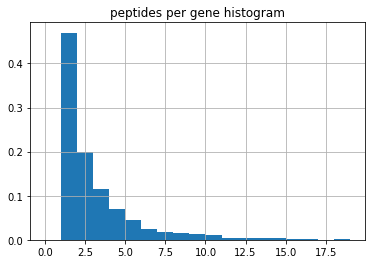

Common protein ids: 951, out of 1595 in phospho data and 6732 in network


In [11]:
ppi = read_network("data/BIOGRID-PUBLICATION-13022-4.1.190.tab3.txt")
phospho_data = read_phospho_data("data/final_ascored_pep_tgr09076_09614.csv")
phospho_data = aggregate_peptide_values(phospho_data, agg=np.median)
phospho_data = restrict_to_common_ids(phospho_data, ppi)

seed = 45
# random.seed(seed)
# ppi = ppi.subgraph(random.sample(sorted(phospho_data.index), 700))

## Network and phospho data properties

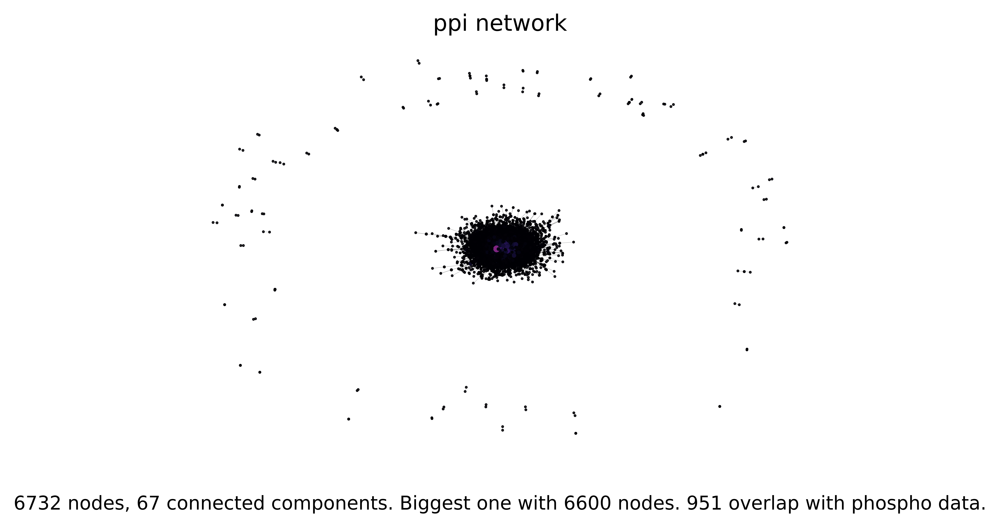

Common protein ids: 936, out of 951 in phospho data and 6600 in network


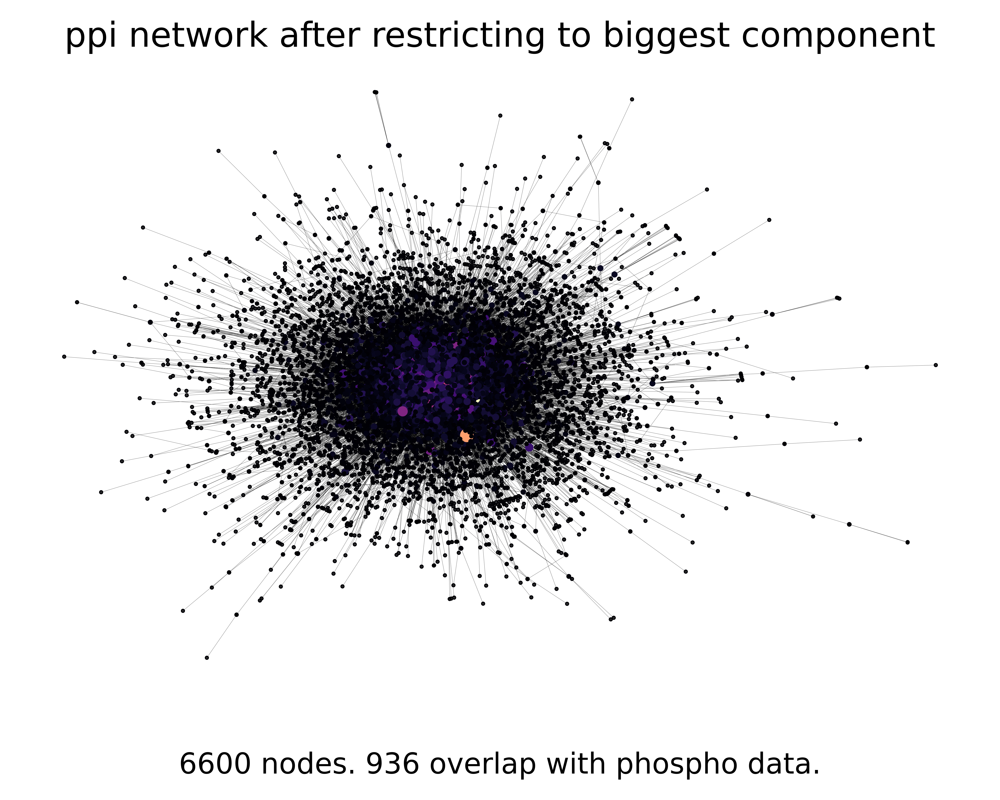

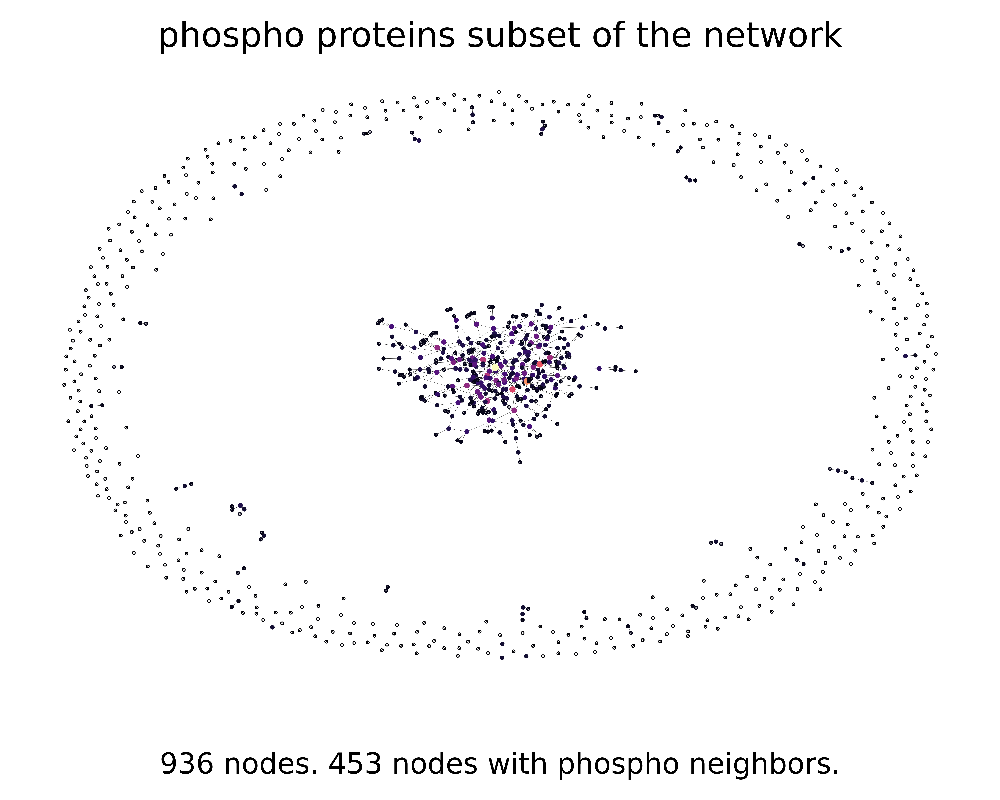

In [12]:
components = list(networkx.connected_components(ppi))

title = "ppi network"
text = """{} nodes, {} connected components. Biggest one with {} nodes. {} overlap with phospho data.""".format(
    len(ppi), len(components), len(components[0]), len(phospho_data))
plot_network(ppi, title, text)
# plotting.plot_network_visjs2jupyter(ppi, title, text)

ppi = ppi.subgraph(components[0]).copy()
phospho_data = restrict_to_common_ids(phospho_data, ppi)

title = "ppi network after restricting to biggest component"
text = """{} nodes. {} overlap with phospho data.""".format(len(ppi), len(phospho_data))
plot_network(ppi, title, text)
# plotting.plot_network_visjs2jupyter(ppi, title, text)

common_subgraph = ppi.subgraph(phospho_data.index)
n_connected = len([d for d in common_subgraph.degree if d[1] > 0])
title = "phospho proteins subset of the network"
text = """{} nodes. {} nodes with phospho neighbors.""".format(len(common_subgraph), n_connected)
plot_network(common_subgraph, title, text)
# plotting.plot_network_visjs2jupyter(ppi, title, text)

## Histograms of values

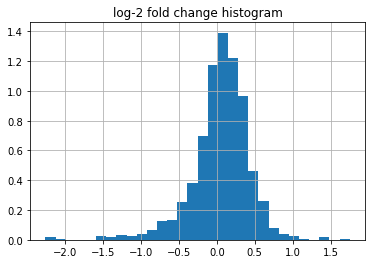

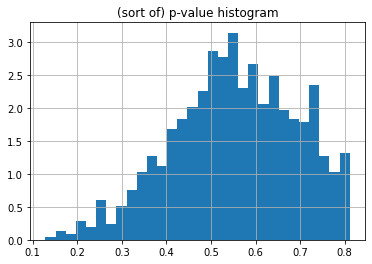

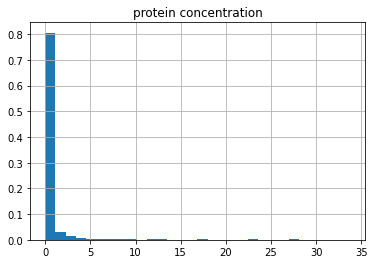

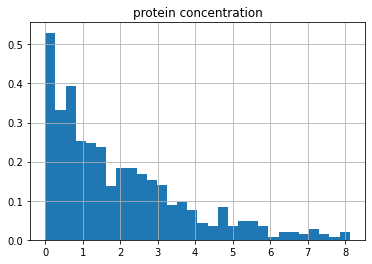

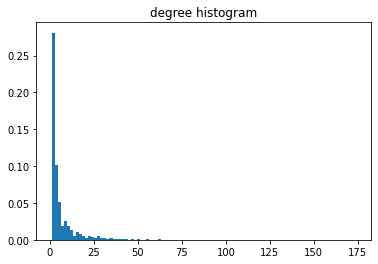

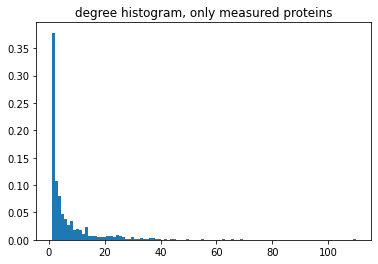

In [13]:
phospho_data['fold'].hist(density=True, bins=30)
plt.title("log-2 fold change histogram")
plt.show()

phospho_data['prob'].hist(density=True, bins=30)
plt.title("(sort of) p-value histogram")
plt.show()

phospho_data['concentration'].hist(density=True, bins=30)
plt.title("protein concentration")
plt.show()

phospho_data['concentration'] = np.log(1 + 100 * phospho_data['concentration'])
phospho_data['concentration'].hist(density=True, bins=30)
plt.title("protein concentration")
plt.show()


plt.hist([x[1] for x in ppi.degree], density=True, bins=100)
plt.title("degree histogram")
plt.show()

plt.hist([x[1] for x in ppi.degree if x[0] in phospho_data.index], density=True, bins=100)
plt.title("degree histogram, only measured proteins")
plt.show()

In [47]:
correlate_vertex_scores_with_distance(ppi, phospho_data['fold'], "log-2 fold change", True)

correlate_vertex_scores_with_distance(ppi, phospho_data['prob'], "phospho p-value", True)


c:\users\ariel\pycharmprojects\fly_regulation\venv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
c:\users\ariel\pycharmprojects\fly_regulation\venv\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


TypeError: Horizontal orientation requires numeric `x` variable.

In [ ]:
# closeness_centrality = networkx.closeness_centrality(ppi)
closeness_centrality = {u: networkx.closeness_centrality(ppi, u) for u in phospho_data.index}
betweenness_centrality = networkx.betweenness_centrality(ppi)
betweenness_centrality = {u: betweenness_centrality[u] for u in phospho_data.index}
degree_centrality = networkx.degree(ppi)
degree_centrality = {u: degree_centrality[u] for u in phospho_data.index}
pagerank_centrality = networkx.pagerank(ppi)
pagerank_centrality = {u: pagerank_centrality[u] for u in phospho_data.index}

vertex_metrics = closeness_centrality, betweenness_centrality, degree_centrality, pagerank_centrality
vertex_metric_names = ["closeness", "betweenness", "degree_centrality", "pagerank_centrality"]

In [ ]:
for (metric1, name1), (metric2, name2) in itertools.combinations(zip(vertex_metrics, vertex_metric_names), 2):
    plot_metrics_comparison(metric1, metric2, name1, name2, phospho_data.index)

In [ ]:
# Spearman correlation
for prot_metric_name in ['fold', 'prob', 'concentration']:
    prot_metric = phospho_data[prot_metric_name]
    for vertex_metric, vertex_metric_name in zip(vertex_metrics, vertex_metric_names):
        plot_metrics_comparison(prot_metric, vertex_metric, prot_metric_name, vertex_metric_name, phospho_data.index)


## Up/Down vertex analysis

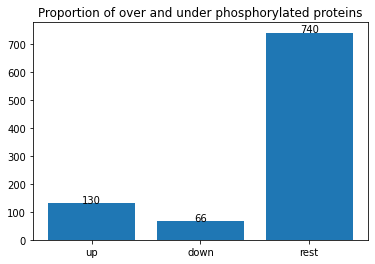

In [38]:
up_proteins, down_proteins = get_up_down_sets(phospho_data, val_threshold=0.5, p_threshold=0.5)
union_proteins = set(down_proteins).union(set(up_proteins))
prots = up_proteins, down_proteins, phospho_data.index

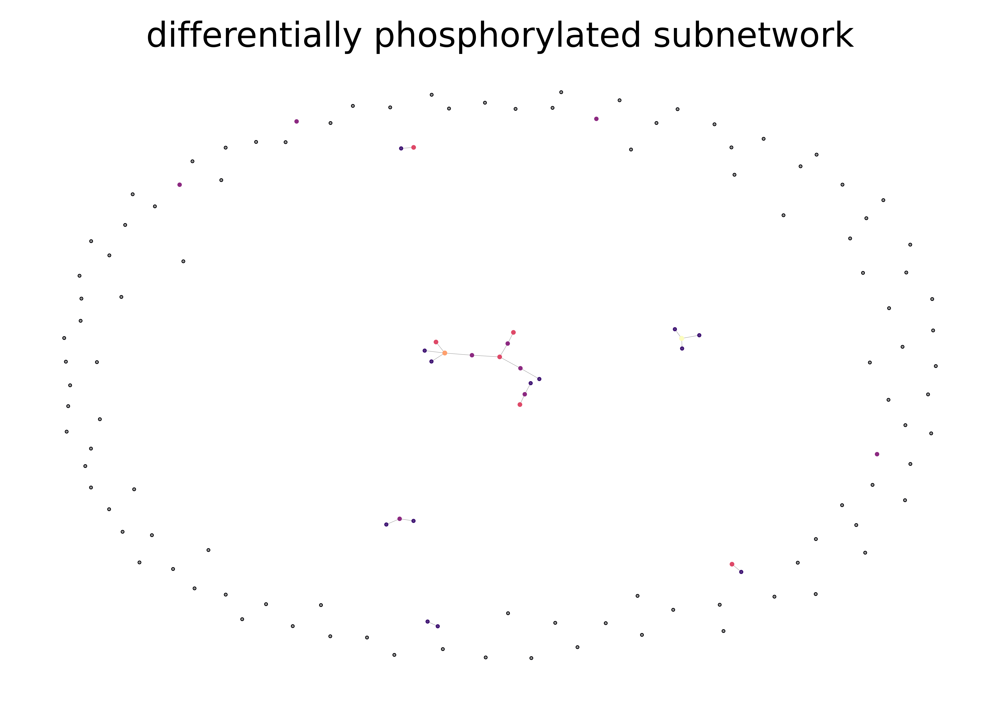

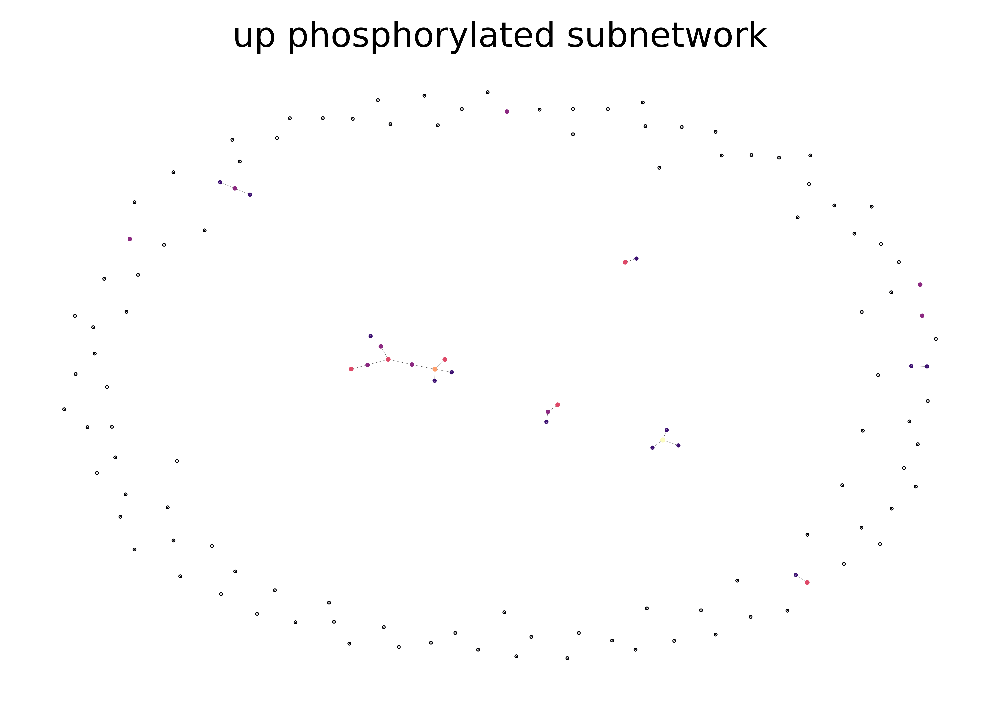

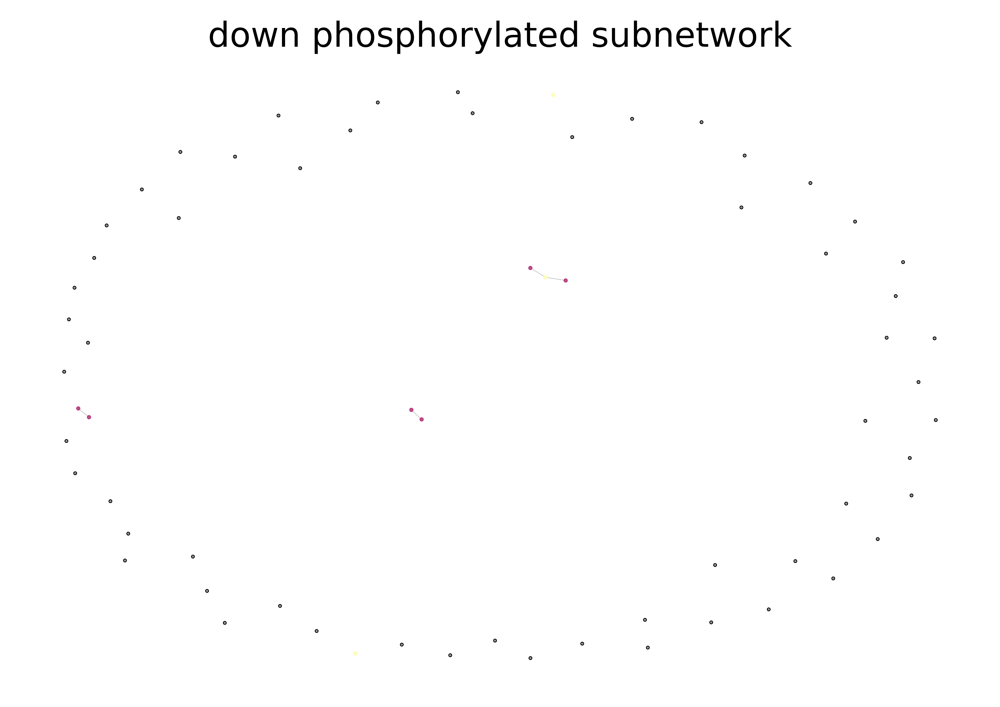

In [40]:
plot_network(networkx.subgraph(ppi, union_proteins), 
             "differentially phosphorylated subnetwork", "")
plot_network(networkx.subgraph(ppi, up_proteins), "up phosphorylated subnetwork", "")
plot_network(networkx.subgraph(ppi, down_proteins), "down phosphorylated subnetwork", "")

In [ ]:
up_down_centrality_analysis(*prots, vertex_metrics, vertex_metric_names)

## Up/Down subset analysis

In [ ]:
subset_metrics = [fraction_of_internal_edges, 
                  normalized_internal_edges_size, 
                  average_shortest_path_len,
                  # average_empirical_num_shortest_paths,
                  ]
subset_metric_names = ["fraction_of_internal_edges", 
                       "normalized_internal_edges_size",
                       "average_shortest_path_len",
                       # "average_empirical_num_shortest_paths",
                       ]

In [ ]:
print("Up proteins")
topological_analysis(ppi, up_proteins, subset_metrics, subset_metric_names, random_iter=2000)


In [ ]:
print("Down proteins")
topological_analysis(ppi, down_proteins, subset_metrics, subset_metric_names, random_iter=2000)

In [ ]:
print("Union proteins")
topological_analysis(ppi, union_proteins, subset_metrics, subset_metric_names, random_iter=2000)

In [ ]:
print("Measured proteins")
topological_analysis(ppi, phospho_data.index, 
                     subset_metrics, subset_metric_names, random_iter=2000)

## Up/down set propagation

In [55]:
seed_values = {n: (1 if n in up_proteins else 0) for n in phospho_data.index}
cross_validate_propagation(ppi, seed_values, method='heat',
                                    alpha=0.15, k=5, scoring='roc_auc',
                                    title_prefix='up proteins propagation', is_classifier=True)

seed_values = {n: (1  if n in down_proteins else 0) for n in phospho_data.index}
cross_validate_propagation(ppi, seed_values, method='heat',
                                    alpha=0.15, k=5, scoring='roc_auc',
                                    title_prefix='down proteins propagation', is_classifier=True)

seed_values = {n: (1  if n in union_proteins else 0) for n in phospho_data.index}
cross_validate_propagation(ppi, seed_values, method='heat',
                                    alpha=0.15, k=5, scoring='roc_auc',
                                    title_prefix='union proteins propagation', is_classifier=True)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
<class 'numpy.ndarray'>



ValueError: multi_class must be in ('ovo', 'ovr')

In [ ]:
# TODO: think of what to do with propagation when values aren't centered around 0
# or positive (or in general deal with missing values)

seed_values = dict(np.log2(1 + np.power(2, phospho_data['fold'])))
cross_validate_propagation(ppi, seed_values, method='heat', 
                                    alpha=0.15, k=5, scoring='explained_variance',
                           title_prefix='fold values propagate', is_classifier=False)


seed_values = dict(np.log2(1 + np.power(2, phospho_data['fold'])))
cross_validate_propagation(ppi, seed_values, method='heat', 
                                    alpha=0.15, k=5, scoring='explained_variance',
                           title_prefix='prob values propagate', is_classifier=False)